# Analysis of spectral data and bathymetry
### Monterey Bay


In this notebook, we create a grid of roughtly square cells over the Monterey Bay area.
For each cell, we merge bathymetry data with spectral data from the Landsat 8 satellite.

Landsat Images downloaded from https://earthexplorer.usgs.gov  
This is Path: 44, Row: 34 (Monterey Bay)  
Image ID: LC08_L1TP_044034_20180601_20180614_01_T1  
Acquisition Date: 01-JUN-18  

Grid Cell Size Thermal	30  
UL Corner Lat	38°31'36.16"N  
UL Corner Long	122°54'01.87"W  
UR Corner Lat	38°07'35.90"N  
UR Corner Long	120°46'42.06"W  
LL Corner Lat	36°48'24.41"N  
LL Corner Long	123°23'28.00"W  
LR Corner Lat	36°24'28.84"N  
LR Corner Long	121°19'01.31"W  
Center Latitude dec	37.47464  
Center Longitude dec	-122.09522  
UL Corner Lat dec	38.52671  
UL Corner Long dec	-122.90052  
UR Corner Lat dec	38.12664  
UR Corner Long dec	-120.77835  
LL Corner Lat dec	36.80678  
LL Corner Long dec	-123.39111  
LR Corner Lat dec	36.40801  
LR Corner Long dec	-121.31703  

In [1]:
# note: notebook optimized for Python 3
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from collections import namedtuple
import xarray as xr
import os
import urllib
%matplotlib inline

In [2]:
# load images for all bands plus the color image
# note: matplotlib can only handle png natively
# pip install pillow to add support for more image types

dir_name = "monterey_data"
gcs_spectral_bucket = "https://storage.googleapis.com/w210data/data/spectral/"
gcs_bathymetry_bucket = "https://storage.googleapis.com/w210data/data/bathymetry/"
gcs_biomass_bucket = "https://storage.googleapis.com/w210data/data/kelp_biomass/"

if not os.path.isdir(dir_name):
    os.mkdir(dir_name)
    
def download_file(file_name, gcs_bucket):
    full_path = os.path.join(dir_name, file_name)
    if not os.path.exists(full_path):
        urllib.request.urlretrieve (gcs_bucket+file_name, full_path)

def load_image(file_name, gcs_bucket):
    download_file(file_name, gcs_bucket)
    full_path = os.path.join(dir_name, file_name)
    return plt.imread(full_path)

b4_file = "LC08_L1TP_044034_20180601_20180614_01_T1_B4.TIF" # red
b5_file = "LC08_L1TP_044034_20180601_20180614_01_T1_B5.TIF" # infrared
color_file = "LC08_L1TP_044034_20180601_20180614_01_T1.jpg"

b4 = load_image(b4_file, gcs_spectral_bucket)
b5 = load_image(b5_file, gcs_spectral_bucket)
color = load_image(color_file, gcs_spectral_bucket)

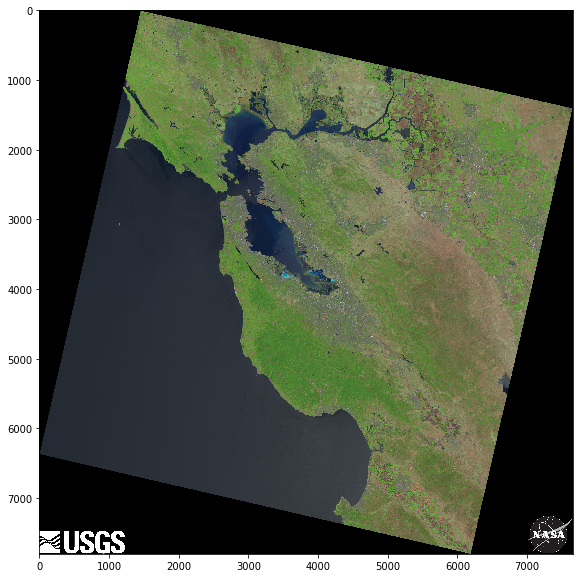

In [3]:
plt.figure(figsize = (10,10))

plt.imshow(color)

## Basic Statistics

In [4]:
top_left = (-123.39111, 38.52671)
bottom_right = (-120.77835, 36.40801)

grid_size = 250

cell_size_lon = (bottom_right[0] - top_left[0]) / grid_size
cell_size_lat = (top_left[1] - bottom_right[1]) / grid_size
cell_size_pixel_h = int(color.shape[0] / grid_size)
cell_size_pixel_v = int(color.shape[1] / grid_size)

print ("Image size: " + str(color.shape))
print ("Cell size: " + str(cell_size_lon) + " by " + str(cell_size_lat))
print ("Pixel cell size: " + str(cell_size_pixel_h) + " by " + str(cell_size_pixel_v))


lon_size_deg = bottom_right[0]-top_left[0]
lat_size_deg = top_left[1]-bottom_right[1]
lon_size_km = lon_size_deg*111 # 1 degree is approximately 111 km
lat_size_km = lat_size_deg*111

print ("Area is approx. " + str(lon_size_km) + " by " + str(lat_size_km) + " km")

Image size: (7801, 7661, 3)
Cell size: 0.010451039999999977 by 0.008474800000000017
Pixel cell size: 31 by 30
Area is approx. 290.0163599999994 by 235.17570000000046 km


## Create grid

In [5]:
#top_left = (-123.39111, 38.52671)
#bottom_right = (-120.77835, 36.40801)

In [6]:
# compute grid / slow version
# WARNING: takes a while!

#grid = pd.DataFrame(index=np.arange(0, grid_size**2), columns=["i", "j", "top", "left", "bottom", "right", "pxtop", "pxleft", "pxbottom", "pxright"])

# function to get lat and lon boundaries of cell (i,j) in grid
#def get_cell_lat_lon(i, j):
#    cell_top_left = (top_left[0] + j * cell_size_lon, top_left[1] - i * cell_size_lat)
#    cell_bottom_right = (top_left[0] + (1+j) * cell_size_lon, 
#                         top_left[1] - (1+i) * cell_size_lat)
#    return cell_top_left, cell_bottom_right

#for i in range(0, grid_size):
#    for j in range(0, grid_size):
#        cell_top_left, cell_bottom_right = get_cell_lat_lon(i, j)
#        pxleft = j * cell_size_pixel_v
#        pxright = pxleft + cell_size_pixel_v - 1
#        pxtop = i * cell_size_pixel_h
#        pxbottom = pxtop + cell_size_pixel_h - 1
#
#        grid.loc[i*grid_size+j] = [i,j, cell_top_left[1], cell_top_left[0], cell_bottom_right[1], cell_bottom_right[0], pxtop, pxleft, pxbottom, pxright]


In [7]:
# compute grid - fast vector implementation

grid = pd.DataFrame(index=np.arange(0, grid_size**2), columns=["i", "j", "top", "left", "bottom", "right", "pxtop", "pxleft", "pxbottom", "pxright"])

grid["i"] = np.arange(0, grid_size).repeat(grid_size)
grid["j"] = np.tile(np.arange(0, grid_size), grid_size)
grid["left"] = top_left[0] + grid["j"]  * cell_size_lon
grid["top"] = top_left[1] - grid["i"]  * cell_size_lat
grid["right"] = top_left[0] + (1+grid["j"]) * cell_size_lon
grid["bottom"] = top_left[1] - (1+grid["i"]) * cell_size_lat
grid["pxleft"] = grid["j"] * cell_size_pixel_v
grid["pxright"] = grid["pxleft"] + cell_size_pixel_v - 1
grid["pxtop"] = grid["i"] * cell_size_pixel_h
grid["pxbottom"]  = grid["pxtop"] + cell_size_pixel_h - 1

grid

,i,j,top,left,bottom,right,pxtop,pxleft,pxbottom,pxright
0,0,0,38.526710,-123.391110,38.518235,-123.380659,0,0,30,29
1,0,1,38.526710,-123.380659,38.518235,-123.370208,0,30,30,59
2,0,2,38.526710,-123.370208,38.518235,-123.359757,0,60,30,89
3,0,3,38.526710,-123.359757,38.518235,-123.349306,0,90,30,119
4,0,4,38.526710,-123.349306,38.518235,-123.338855,0,120,30,149
5,0,5,38.526710,-123.338855,38.518235,-123.328404,0,150,30,179
6,0,6,38.526710,-123.328404,38.518235,-123.317953,0,180,30,209
7,0,7,38.526710,-123.317953,38.518235,-123.307502,0,210,30,239
8,0,8,38.526710,-123.307502,38.518235,-123.297051,0,240,30,269
9,0,9,38.526710,-123.297051,38.518235,-123.286600,0,270,30,299


In [8]:
# overlay grid on image
color2 = np.array(color)

thickness = 1
grid_color = [255, 255, 255]

for x in range(0,color.shape[0],cell_size_pixel_h):
    color2[x-thickness:x+thickness, 0:color.shape[1]] = grid_color

for y in range(0,color.shape[1],cell_size_pixel_v):
    color2[0:color.shape[0], y-thickness:y+thickness] = grid_color


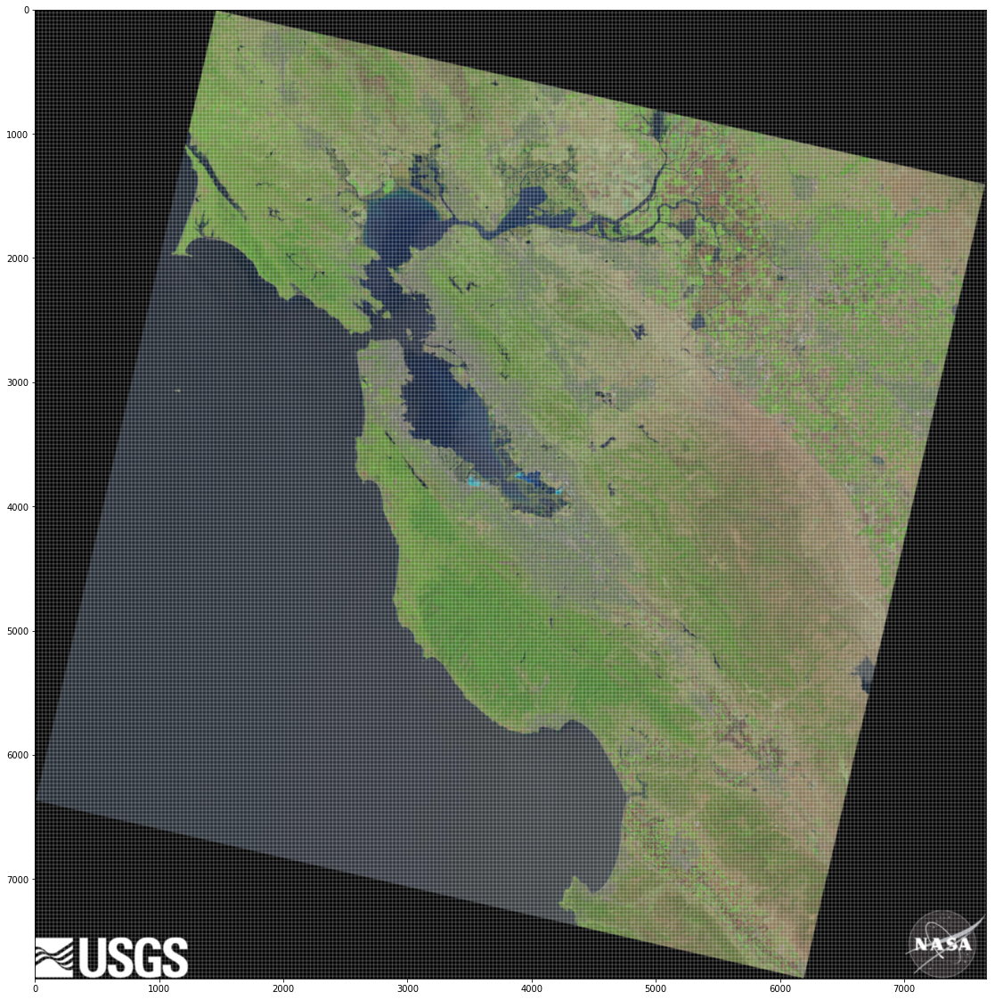

In [9]:
plt.figure(figsize = (20,20))
plt.imshow(color2, interpolation="bicubic")
#plt.imsave(arr=color2, fname="out.jpg")

## Load bathymetry data

In [10]:
# load depth dataset
bathymetry_file = "bathymetry_monterey.xyz"
download_file(bathymetry_file, gcs_bathymetry_bucket)
depth = pd.read_csv(os.path.join(dir_name, bathymetry_file), names=["lon", "lat", "depth", "i", "j", "idx"])

In [11]:
depth

,lon,lat,depth,i,j,idx
0,-122.750000,37.25,-126.4,NaN,NaN,NaN
1,-122.749167,37.25,-125.7,NaN,NaN,NaN
2,-122.748333,37.25,-125.6,NaN,NaN,NaN
3,-122.747500,37.25,-125.0,NaN,NaN,NaN
4,-122.746667,37.25,-124.9,NaN,NaN,NaN
5,-122.745833,37.25,-124.6,NaN,NaN,NaN
6,-122.745000,37.25,-119.5,NaN,NaN,NaN
7,-122.744167,37.25,-119.1,NaN,NaN,NaN
8,-122.743333,37.25,-118.3,NaN,NaN,NaN
9,-122.742500,37.25,-117.7,NaN,NaN,NaN


In [12]:
depth["j"] = ((depth["lon"]-top_left[0])/cell_size_lon).astype(int)
depth["i"] = ((top_left[1]-depth["lat"])/cell_size_lat).astype(int)

depth["idx"] = depth["i"]*grid_size+depth["j"]

filtered_depth = depth[(depth["i"]>=0) & (depth["j"]>=0) & (depth["i"]<grid_size) & (depth["j"]<grid_size)]

In [13]:
# aggregate depth data based on the grid defined above
d = pd.DataFrame(filtered_depth.groupby(['idx'])['depth'].agg('mean')) # mean depth in cell
grid = grid.join(d)

In [14]:
def highlight_cell(image, color, row, force=False):
    cell = image[row.pxtop:row.pxbottom, row.pxleft:row.pxright]
    if force:
        cell = color
    else:
        cell = np.multiply(cell, color)
    image[row.pxtop:row.pxbottom, row.pxleft:row.pxright] = np.minimum(cell, [255,255,255]).astype(int)    

In [15]:
# highlight cells with depth data
for row in grid.itertuples():
    if pd.isnull(row.depth):
        highlight_cell(color2, [0.5,0.5,0.5], row)
    else:
        if row.depth>0:
            highlight_cell(color2, [1.5,1,1], row)
        else:
            highlight_cell(color2, [1,1.5,1], row)



In [16]:
#top_left = (-123.39111, 38.52671)
#bottom_right = (-120.77835, 36.40801)
  
# as a reference, highlight cells with San Francisco and Berkeley
sf = namedtuple("Point", ["lon", "lat", "depth", "i", "j", "idx", "x1", "x2", "y1", "y2"])         
sf.lat = 37.773972
sf.lon = -122.431297
sf.j = int((sf.lon-top_left[0])/cell_size_lon)
sf.i = int((top_left[1]-sf.lat)/cell_size_lat)

sf.idx = sf.i * grid_size+sf.j

sf.pxleft = sf.j * cell_size_pixel_v
sf.pxright = sf.pxleft + cell_size_pixel_v - 1
sf.pxtop = sf.i * cell_size_pixel_h
sf.pxbottom = sf.pxtop + cell_size_pixel_h - 1

be = namedtuple("Point", ["lon", "lat", "depth", "i", "j", "idx", "x1", "x2", "y1", "y2"])         
be.lat = 37.871853
be.lon = -122.258423
be.j = int((be.lon-top_left[0])/cell_size_lon)
be.i = int((top_left[1]-be.lat)/cell_size_lat)

be.idx = be.i * grid_size+be.j

be.pxleft = be.j * cell_size_pixel_v
be.pxright = be.pxleft + cell_size_pixel_v - 1
be.pxtop = be.i * cell_size_pixel_h
be.pxbottom = be.pxtop + cell_size_pixel_h - 1


highlight_cell(color2, [0,255,0], sf, True)
highlight_cell(color2, [0,255,0], be, True)

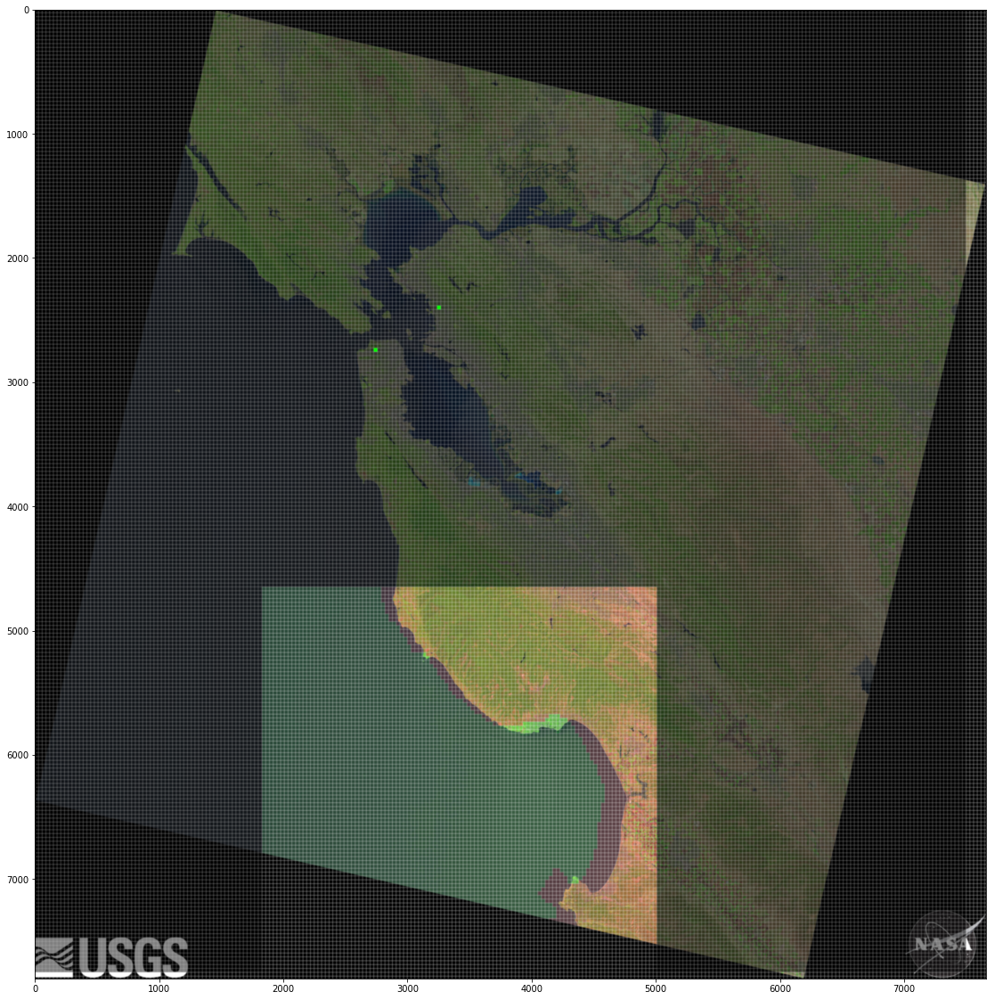

In [17]:
plt.figure(figsize = (20,20))
plt.imshow(color2, interpolation="bicubic")
#plt.imsave(arr=color2, fname="out.jpg")

### Now merge with spectral data

In [18]:
# compute NDVI based on bands B4 (red) and B5 (infrared)
ir_float = b5.astype(float)
red_float = b4.astype(float)
ndvi = np.divide(ir_float - red_float, ir_float + red_float)

/Users/vcz/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [19]:
ndvi_grid = pd.DataFrame(index=np.arange(0, grid_size**2), columns=["mean_ndvi"])

for i in range(0, grid_size):
    for j in range(0, grid_size):
        pxleft = j * cell_size_pixel_v
        pxright = pxleft + cell_size_pixel_v - 1
        pxtop = i * cell_size_pixel_h
        pxbottom = pxtop + cell_size_pixel_h - 1
        myslice = ndvi[pxtop:pxbottom, pxleft:pxright].reshape(-1)
        
        mymean = np.mean(myslice)
        ndvi_grid.loc[i*grid_size+j] = [mymean]
        



In [20]:
grid = grid.join(ndvi_grid)
grid

,i,j,top,left,bottom,right,pxtop,pxleft,pxbottom,pxright,depth,mean_ndvi
0,0,0,38.526710,-123.391110,38.518235,-123.380659,0,0,30,29,NaN,NaN
1,0,1,38.526710,-123.380659,38.518235,-123.370208,0,30,30,59,NaN,NaN
2,0,2,38.526710,-123.370208,38.518235,-123.359757,0,60,30,89,NaN,NaN
3,0,3,38.526710,-123.359757,38.518235,-123.349306,0,90,30,119,NaN,NaN
4,0,4,38.526710,-123.349306,38.518235,-123.338855,0,120,30,149,NaN,NaN
5,0,5,38.526710,-123.338855,38.518235,-123.328404,0,150,30,179,NaN,NaN
6,0,6,38.526710,-123.328404,38.518235,-123.317953,0,180,30,209,NaN,NaN
7,0,7,38.526710,-123.317953,38.518235,-123.307502,0,210,30,239,NaN,NaN
8,0,8,38.526710,-123.307502,38.518235,-123.297051,0,240,30,269,NaN,NaN
9,0,9,38.526710,-123.297051,38.518235,-123.286600,0,270,30,299,NaN,NaN


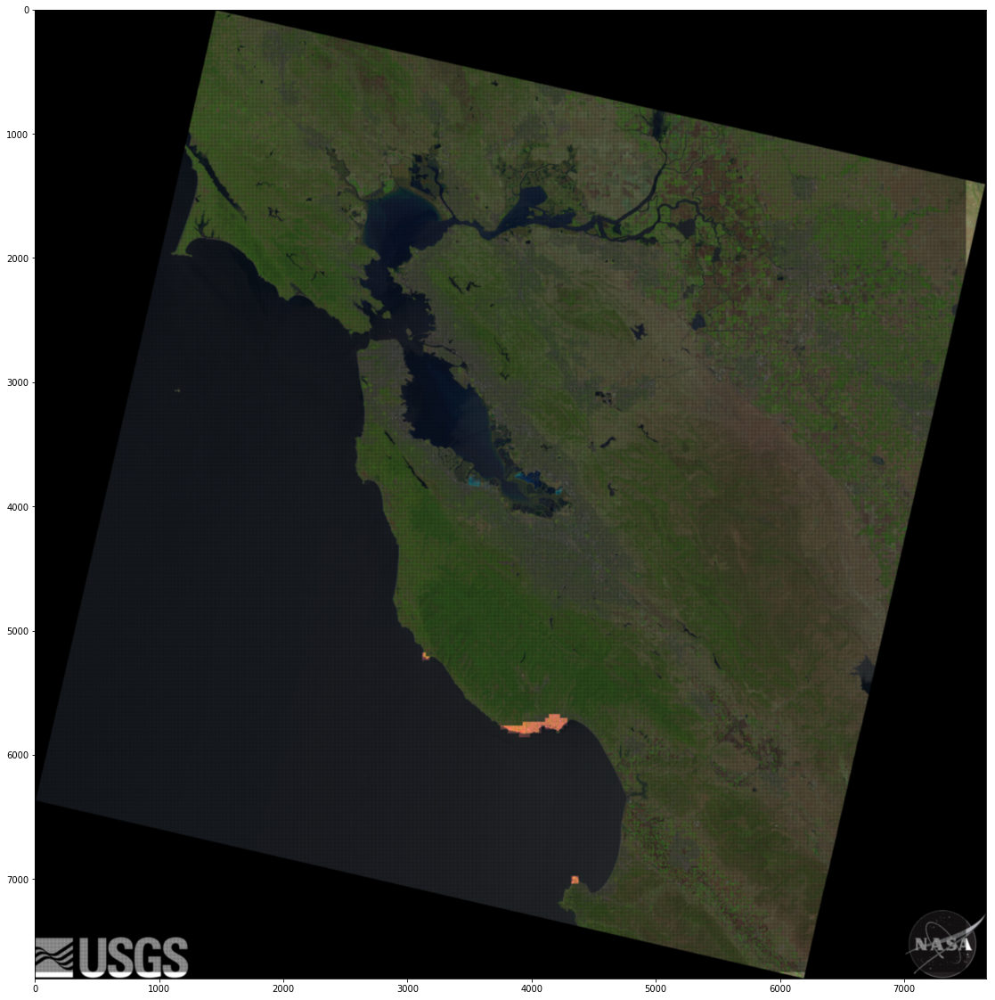

In [21]:
color3 = np.array(color)

# highlight cells with ndvi>0 and depth<0
for row in grid.itertuples():
    if row.mean_ndvi>0 and row.depth<0:
        highlight_cell(color3, [2,1,1], row)
    else:
        highlight_cell(color3, [0.5,0.5,0.5], row)

plt.figure(figsize = (20,20))
plt.imshow(color3, interpolation="bicubic")




## Mean water depth where kelp grows

In [22]:
kelp = grid[grid["mean_ndvi"]>0][grid["depth"]<0]
kelp["depth"].mean()

/Users/vcz/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


-13.671453707111603

In [23]:
kelp

,i,j,top,left,bottom,right,pxtop,pxleft,pxbottom,pxright,depth,mean_ndvi
41854,167,104,37.111418,-122.304202,37.102944,-122.293751,5177,3120,5207,3149,-4.602308,0.245143
42104,168,104,37.102944,-122.304202,37.094469,-122.293751,5208,3120,5238,3149,-18.066154,0.0125603
42105,168,105,37.102944,-122.293751,37.094469,-122.283300,5208,3150,5238,3179,-0.868462,0.186522
45888,183,138,36.975822,-121.948866,36.967347,-121.938415,5673,4140,5703,4169,-1.070833,0.215449
45889,183,139,36.975822,-121.938415,36.967347,-121.927964,5673,4170,5703,4199,-7.081538,0.149262
45890,183,140,36.975822,-121.927964,36.967347,-121.917513,5673,4200,5703,4229,-5.138333,0.186112
46137,184,137,36.967347,-121.959318,36.958872,-121.948866,5704,4110,5734,4139,-6.076154,0.185905
46138,184,138,36.967347,-121.948866,36.958872,-121.938415,5704,4140,5734,4169,-11.315833,0.283582
46139,184,139,36.967347,-121.938415,36.958872,-121.927964,5704,4170,5734,4199,-10.843846,0.191827
46140,184,140,36.967347,-121.927964,36.958872,-121.917513,5704,4200,5734,4229,-10.115000,0.208919


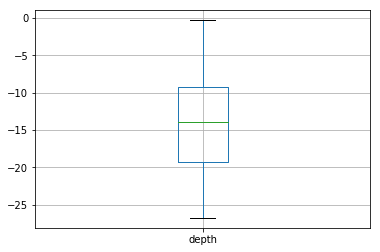

In [24]:
kelp.boxplot("depth")

## Next step: compare against existing biomass dataset

In [25]:
biomass_file = "LandsatKelpBiomass_2017.nc"
download_file(biomass_file, gcs_biomass_bucket)

kelp_biomass = xr.open_dataset(os.path.join(dir_name, biomass_file)).to_dataframe()

In [26]:
kelp_biomass_2015 = kelp_biomass[kelp_biomass["year"]==2015]
kelp_biomass_Q2_2015 = kelp_biomass_2015[kelp_biomass_2015["quarter"]==2]
kelp_biomass_Q2_2015

,,lat,lon,year,quarter,biomass,biomass_se,passes,passes5,passes7,passes8
station,time,,,,,,,,,,
0,125,32.357324,-117.221337,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
1,125,32.357324,-117.221018,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
2,125,32.357325,-117.220699,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
3,125,32.357593,-117.221975,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
4,125,32.357595,-117.221338,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
5,125,32.357595,-117.221019,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
6,125,32.357596,-117.220700,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
7,125,32.357862,-117.222933,2015,2,0.0,0.0,5.0,0.0,2.0,3.0
8,125,32.357863,-117.222614,2015,2,0.0,0.0,5.0,0.0,2.0,3.0


In [27]:
kelp_biomass_Q2_2015["j"] = ((kelp_biomass_Q2_2015["lon"]-top_left[0])/cell_size_lon).astype(int)
kelp_biomass_Q2_2015["i"] = ((top_left[1]-kelp_biomass_Q2_2015["lat"])/cell_size_lat).astype(int)

kelp_biomass_Q2_2015["idx"] = kelp_biomass_Q2_2015["i"]*grid_size+kelp_biomass_Q2_2015["j"]

filtered_biomass = kelp_biomass_Q2_2015[(kelp_biomass_Q2_2015["i"]>=0) & (kelp_biomass_Q2_2015["j"]>=0) & (kelp_biomass_Q2_2015["i"]<grid_size) & (kelp_biomass_Q2_2015["j"]<grid_size)]

filtered_biomass

/Users/vcz/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/vcz/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/vcz/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

,,lat,lon,year,quarter,biomass,biomass_se,passes,passes5,passes7,passes8,j,i,idx
station,time,,,,,,,,,,,,,
289531,125,36.408151,-121.916660,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289532,125,36.408154,-121.916994,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289533,125,36.408157,-121.917329,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289534,125,36.408160,-121.917663,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,140,249,62390
289535,125,36.408421,-121.916656,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289536,125,36.408424,-121.916991,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289537,125,36.408428,-121.917325,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,141,249,62391
289538,125,36.408431,-121.917660,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,140,249,62390
289539,125,36.408434,-121.917994,2015,2,0.0,0.0,2.0,0.0,2.0,0.0,140,249,62390


In [28]:
d = pd.DataFrame(filtered_biomass.groupby(['idx'])['biomass'].agg('mean')) # mean biomass in cell
grid = grid.join(d)

In [29]:
grid

,i,j,top,left,bottom,right,pxtop,pxleft,pxbottom,pxright,depth,mean_ndvi,biomass
0,0,0,38.526710,-123.391110,38.518235,-123.380659,0,0,30,29,NaN,NaN,NaN
1,0,1,38.526710,-123.380659,38.518235,-123.370208,0,30,30,59,NaN,NaN,NaN
2,0,2,38.526710,-123.370208,38.518235,-123.359757,0,60,30,89,NaN,NaN,NaN
3,0,3,38.526710,-123.359757,38.518235,-123.349306,0,90,30,119,NaN,NaN,NaN
4,0,4,38.526710,-123.349306,38.518235,-123.338855,0,120,30,149,NaN,NaN,NaN
5,0,5,38.526710,-123.338855,38.518235,-123.328404,0,150,30,179,NaN,NaN,NaN
6,0,6,38.526710,-123.328404,38.518235,-123.317953,0,180,30,209,NaN,NaN,NaN
7,0,7,38.526710,-123.317953,38.518235,-123.307502,0,210,30,239,NaN,NaN,NaN
8,0,8,38.526710,-123.307502,38.518235,-123.297051,0,240,30,269,NaN,NaN,NaN
9,0,9,38.526710,-123.297051,38.518235,-123.286600,0,270,30,299,NaN,NaN,NaN


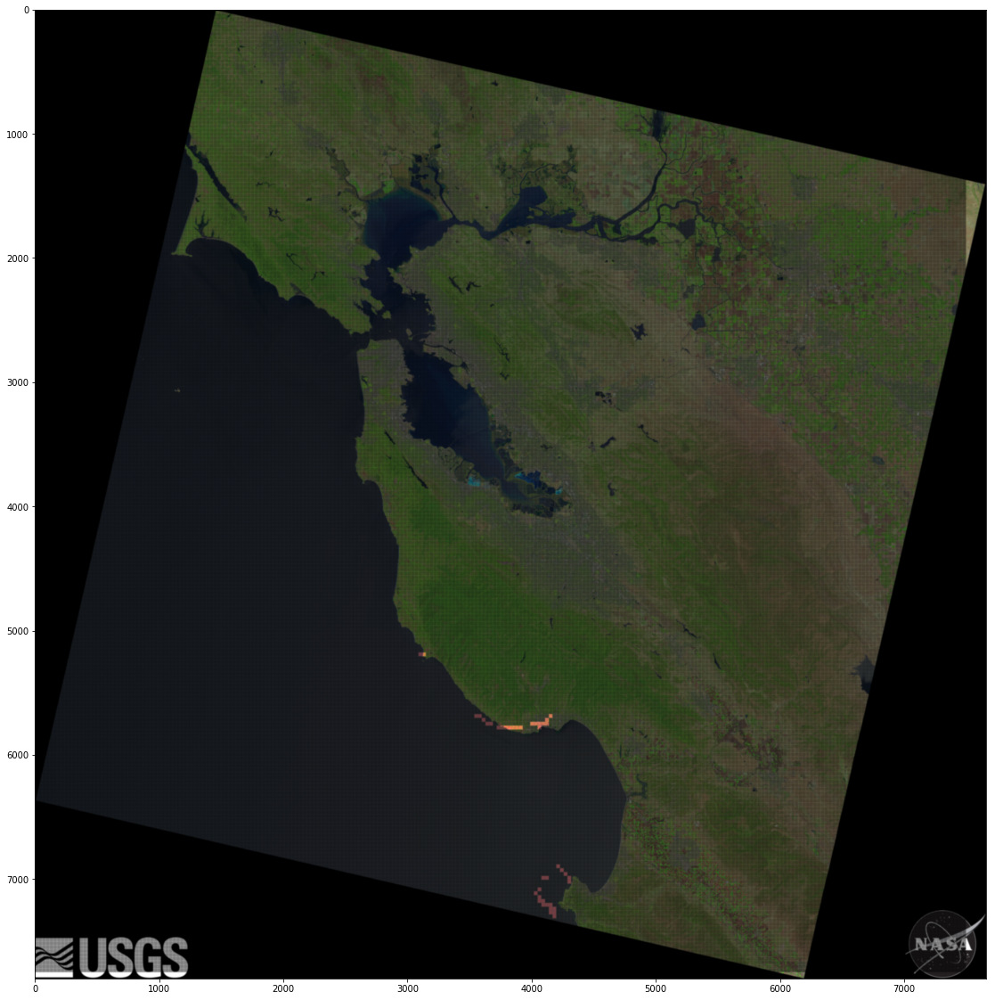

In [30]:
color4 = np.array(color)

# highlight cells with ndvi>0 and depth<0
for row in grid.itertuples():
    if row.biomass>0 and row.depth<0:
        highlight_cell(color4, [2,1,1], row)
    else:
        highlight_cell(color4, [0.5,0.5,0.5], row)

plt.figure(figsize = (20,20))
plt.imshow(color4, interpolation="bicubic")





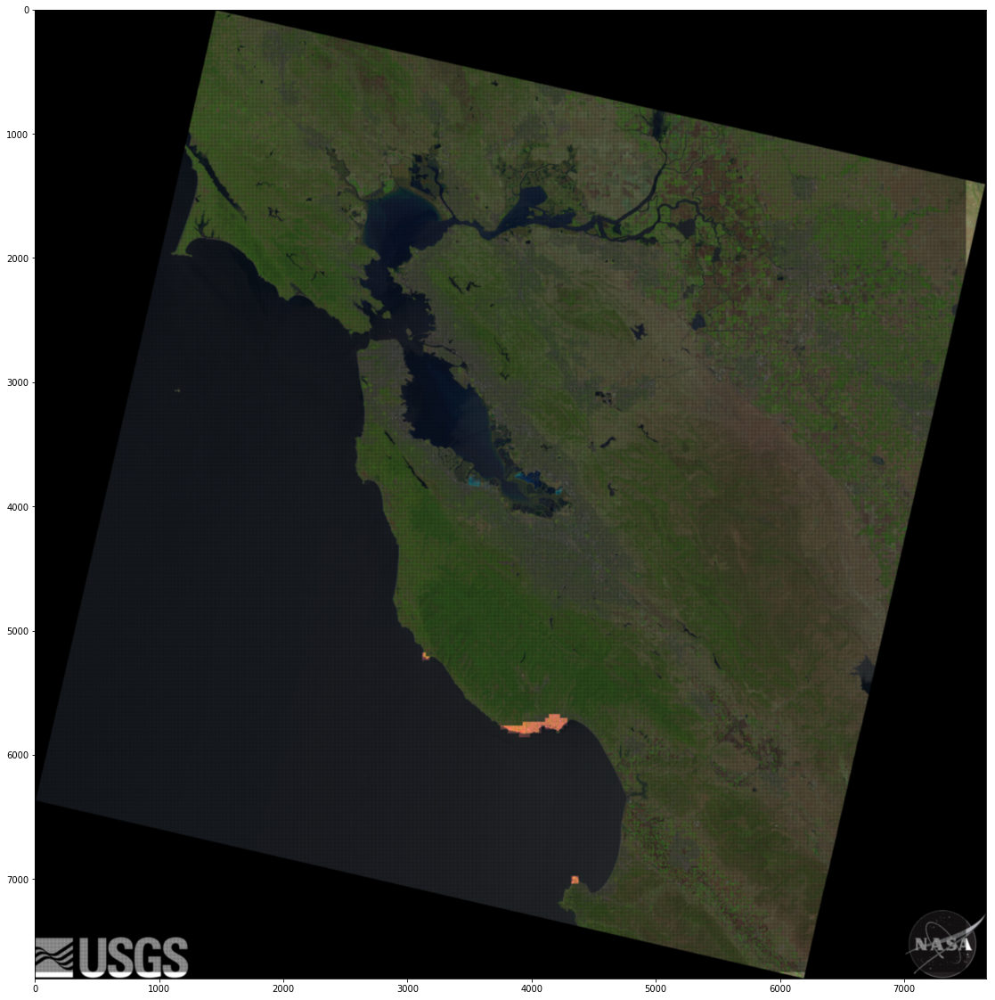

In [31]:
plt.figure(figsize = (20,20))

plt.imshow(color3, interpolation="bicubic")

